# Assignment 04: Who who survived the Titanic?

In this assignment, we will get some practical experience with classification trees, and tune our first machine learning model. As mentioned in a couple of course emails, we will be using the "decision tree classifier" implementation in the Python package [scikit-learn](http://scikit-learn.org/stable/documentation.html). Go check out the documentation/tutorial pages of this package, it is a great resource. We will use only classification trees in this homework, but the workflow is very similar in many different, and more advanced types of machine learning methods. The great utility of a package like scikit-learn means you can very easily start tuning and using sophisticated machine learning models to make predictions, even if you are not familiar with the underlying algorithms. But there is one important thing to keep in mind: **The danger zone!**

<img width="300" src="./img/danger_zone.png"></img>

If you have a prediction/detection problem to solve in your research field and you have access to the advanced tools of machine learning, it is very tempting to just leave learning about the various statistical subtleties to a later time, and just jump into the (admittedly, fun) task of building models. This is a dangerous thing to do, because there are a bunch of pitfalls in this field that make it very easy to fool yourself into thinking you have good models, when in fact you don't. One of the most important questions along these lines is how to tune and evaluate a model properly. In this homework we will try to lay the groundwork for this. 

As mentioned in the pre-homework email, we will be using the _Titanic_ dataset from Kaggle. In contrast to the previous homeworks, I have not uploaded the data into the assignment directory for SMC; part of the aim of this homework is to get you familiarized with the workings of Kaggle, so your first task will be to download the datasets to your computers, and then upload them to the directory of this assignment on SMC. 

But first, we will start with a small lecture/tutorial on classification trees and how to tune them. 

<!---
[//]: # - Notes about
[//]: # - Split criterion; quantifying the quality of a split
[//]: # - How to select the next node to split: Depth-first vs. breadth-first, greediness
[//]: # - Kaggle & Titanic: https://www.kaggle.com/c/titanic


[//]: # http://scikit-learn.org/stable/modules/tree.html
[//]: # http://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

[//]: # https://www.kaggle.com/c/titanic/details/getting-started-with-python
[//]: # https://www.kaggle.com/c/titanic/details/getting-started-with-python-ii
[//]: # https://www.kaggle.com/c/titanic/details/getting-started-with-random-forests
[//]: # 
[//]: # https://www.kaggle.com/c/titanic/data
--->

## Introduction to classification trees: A tutorial

I am preparing this section of the notebook as a tutorial, I encourage you to try out the commands and play around  with it to familiarize yourself with the concepts. If you see that I use a function that you are not familiar with, feel free to try it out yourself to see what it does.

### Create a synthetic dataset

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_palette(sns.color_palette('Paired'))

%matplotlib inline

Start by defining a few functions to create a synthetic dataset. We will use machine learning to learn from from this dataset.

The datasets will be created by sampling points inside a square using a uniform distribution, and labeling them according to their distance from the origin; points closer than a distance of 1 will be called 'near', and others will be called 'far'. To make the setting a bit closer to "real life", we will add some noise to the data by switching the labels of some of the points randomly.

In [2]:
# Try out np.repeat and np.tile to see what they do

def create_data(n_points, p_flip=0.1):
    """Returns a dataframe with columns X1, X2, y. First creates an 
    (n_grid x n_grid) square inside 0 < X1, X2 < 2, and then labels the 
    points on this grid as 'near' if they are a distance of < 1 from the 
    origin, 'far' otherwise. Finally, randomly flips the labels with a
    probability of p_flip. The labels are contained in column y."""

    # Sample from the interval [0,2] using the uniform distribution
    X1 = np.random.rand(n_points) * 2
    X2 = np.random.rand(n_points) * 2
    X = np.column_stack([X1,X2])

    # The output variable measures whether the distance is < 1
    y = np.sum(X*X,axis=1) < 1

    # The y entries to flip, randomly sampled
    flip = np.random.choice([True, False], size=len(y), p=[p_flip, 1-p_flip])
    y = np.logical_xor(y, flip)

    # Change the labeling from True/False to "near", "far"
    y = np.where(y, 'near', 'far')

    # Return data frame
    return pd.DataFrame({'X1': X1, 'X2': X2, 'y':y})

Next, we create a simple plotting functions to visualize the dataset. We are using a very useful Pandas method called `groupby()`, which I mentioned in a previous assignment. If you are not familiar with it, you can read about it [here](http://pandas.pydata.org/pandas-docs/stable/groupby.html) (not needed for this assignment, but do take a look when you get a chance).

In [3]:
def plot_classes(df):
    groups = pd.groupby(df, 'y')

    for name, group in groups: 
        plt.plot(group.X1, group.X2, '.', label=name)
    
    # have equal scaling for x and y
    plt.axis('equal') 
    # put the color legend outside the plot region
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=16) 
    plt.show()

In [4]:
df_clean = create_data(5000, p_flip = 0)
print df_clean.head(5)

         X1        X2    y
0  0.909619  1.075597  far
1  1.658564  0.009791  far
2  1.113870  0.505834  far
3  0.681444  1.058552  far
4  1.774646  0.122539  far


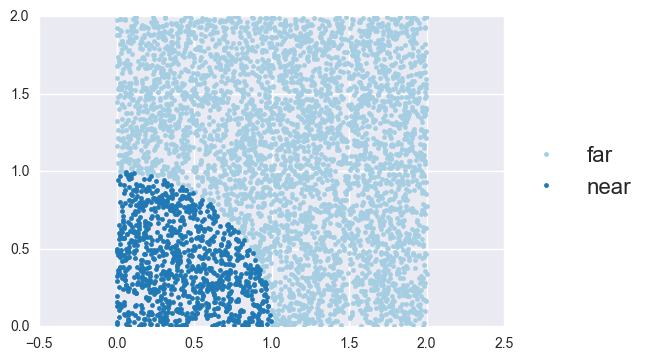

In [5]:
plot_classes(df_clean)

Let's next create a noisy version of our dataset by assigning a nonzero "class flip" probability. We will use this dataset to create a predictive model below--this will be our training set.

In [6]:
# We will use a "random seed" for the (pseudo-)random dataset creation, 
# our datasets will look random, but we will get the same results each
# time due to this reproducibility seed. To get different 
# results, simply change this random seed.

TRAIN_SEED = 3
np.random.seed(TRAIN_SEED)

df_train = create_data(2500, p_flip=0.1)

In [7]:
print df_train.head()

         X1        X2    y
0  1.101596  0.550481  far
1  1.416296  1.704858  far
2  0.581809  0.879703  far
3  1.021655  1.562559  far
4  1.785894  0.583550  far


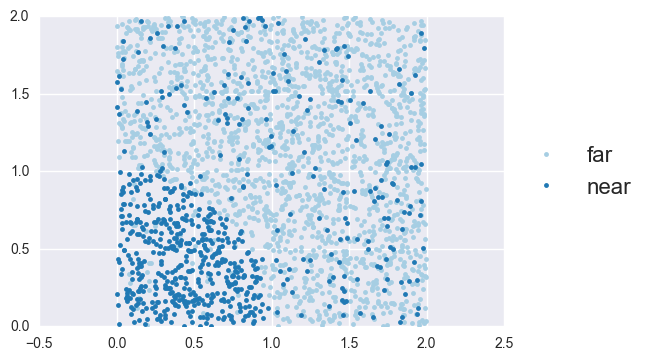

In [8]:
plot_classes(df_train)

You can see that the two classes have mixed a bit due to the added noise.

### Build a decision tree classifier

We first define a function to visualize the classification trees we will create below. Don't worry too much about this, it is not central to the machine learning; it just helps create nice visual representations of the models.

In [9]:
from IPython.display import Image  
from sklearn import tree
import pydot
def plot_tree(clf):
    dot_data = tree.export_graphviz(clf, out_file=None, 
                             feature_names=['X1', 'X2'],
                             class_names=['far', 'near'],  
                             filled=True, rounded=True,  
                             special_characters=True, impurity=False)
    graph = pydot.graph_from_dot_data(dot_data)  
    return Image(graph.create_png())  

Let's next try to learn from our dataset using a classification tree. For this, we will use the classification tree implementation of the popular machine learnig library `scikit-learn`. I mentioned [this tutorial](http://scikit-learn.org/stable/modules/tree.html) over email, which you can refer to as needed. 

The first step is to import the `DecisionTreeClassifier` from the tree module in `scikit-learn`.

In [10]:
from sklearn.tree import DecisionTreeClassifier

The basic workflow in `scikit learn` is as follows:

1. Create an instance of a machine learning method (e.g. a decision tree classifier), setting the parameters to desired values
2. Use the `.fit()` method of the resulting classifier object on a dataset to learn from the data
3. Use the `.predict()` method of the resulting classifier to make predictions on new data.

There are many helper functions that make it easier to tune models, etc., but these three steps allow you to do everything you need to do.

In our case, we will be using a classification tree with a given maximum number of leaves. Let's start by creating an instance of a `DecisionTreeClassifier` (which we will call `clf`). We are setting the max number of leaves to 3. 

In [11]:
clf = DecisionTreeClassifier(max_leaf_nodes=3)

Now, this `"clf"` is holding a decision tree classifier that can learn from any data we feed to it. It is a blank
slate, a [tabula rasa](https://en.wikipedia.org/wiki/Tabula_rasa). Using its `fit()` method on a dataset, we will have it learn to predict. The fit method has two main inputs: the input columns of the dataset as a matrix or a data frame, and the output column. In our case, the input columns are `X1` and `X2`, so we just select them from our data frame together, and feed as the input data. The output column is the `y` column, so we feed that as the second argument.

In [12]:
clf.fit(df_train[['X1', 'X2']], df_train['y'])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=3, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

Note that we don't need to set the output of this `fit()` method to anything; the "fitting" procedure updates our object `clf`, and saves all the tree information inside it.

In other words, our classifier, `clf`, has now learned from our data; its internal state is updated to contain the the splits/prediction rules of the resulting decision tree. If you want to dig into this object and explore its attributes, you are welcome to do so, but this is not needed.

Let's next visualize our decision tree. I'm using here the helper function I defined above. 

In [13]:
plot_tree(clf)

AttributeError: 'NoneType' object has no attribute 'write'

As you can see, the first split (the "root" of the tree, shown at the top) is at `X2 <= 0.91`. If we feed a data point to our tree with `X1` greater than this value, that point ends in the "leaf node" on the right, and gets assigned the class prediction "`far`". 

If `X2` is less than `0.91`, we go to the left hand node, and this one has a split at `X1 <= 0.95`. If our data point satisfies this inequality, it is sent to the left (blue) child, and gets assigned the prediction `near`. If it doesn't satisfy the inequality, it is sent to the right node, where it gets the prediction `far`. 

You can see that our tree has 3 terminal, "leaf" nodes, and two of them have the class prediction "far" assigned, and one of them has the class prediction "near" assigned. The color coding here represents classes, and how "sure" the prediction is: Blue represents `near`, orange represents `far`, and darker colors represent more confident predictions.

What is this confidence based on? It is based on the "purity" of the node: For the training set, how pure was each node in terms of the number of points that fell in it? Refer to the `scikit-learn` documentation on classification trees for further details on how purity is defined.

Now that we have a decision tree created, we can make predictions with it. To do this, we simply use the `.predict()` method of our object, and feed in the input columns of the dataset we want to make predictions for. Let's start by predicting the classes of our training data.

In [23]:
y_predictions = clf.predict(df_train[['X1','X2']])

Let's create a predictions data frame to visualize our predictions: copy the original data frame, and replace the y column with predictions.

In [24]:
df_predictions = df_train.copy()
df_predictions['y'] = y_predictions

What is the fraction of correct predictions? 

Since NumPy treats the logicals `True` and `False` as floating point numbers `1` and `0` when you feed them into numerical functions, we can find the fraction of correct answers by simply calculating the mean of the Boolean of correct predictions.

In [26]:
print "Accuracy on the training set:", np.mean(df_train.y == df_predictions.y)

Accuracy on the training set: 0.88


So we have about 88% classification accuracy on the training set, which is the set we learned from. Note that if you memorize this training set, you can get 100% accuracy! The real challenge is to learn from this training set, and make accurate predictions on a separate test set.

Let's compare the correct values with the predictions visually.

The original data


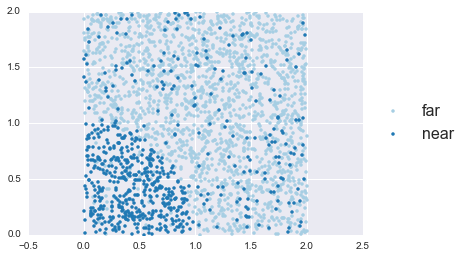

Our predictions


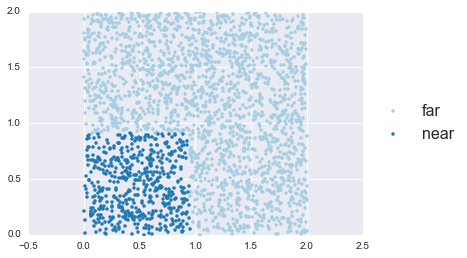

In [27]:
print "The original data"
plot_classes(df_train)
print "Our predictions"
plot_classes(df_predictions)

As you can see, our predictions represent a crude approximation to the structure of the data. This is because our tree was too shallow.

Let's try a deeper tree. 

In [28]:
clf_deep = DecisionTreeClassifier(max_leaf_nodes=8)
clf_deep.fit(df_train[['X1', 'X2']], df_train['y'])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=8, min_impurity_split=1e-07,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

Once again, let's visualize the resulting tree.

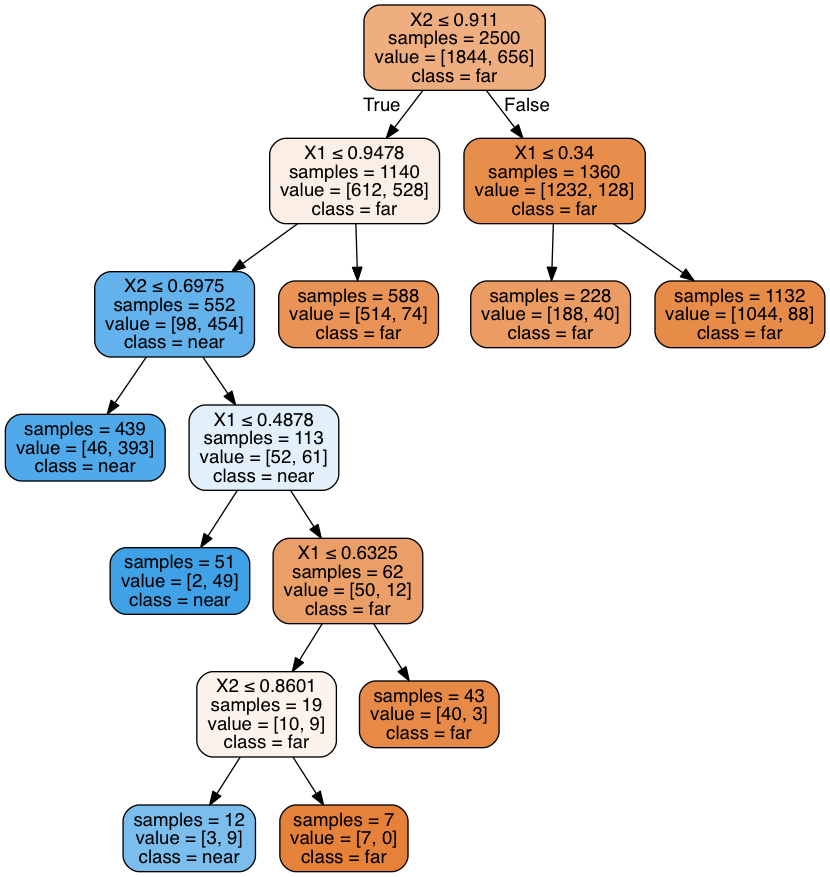

In [29]:
plot_tree(clf_deep)

This is a model with a higher degree of complexity. Once again, create predictions for the deep tree (and put them inside a data frame).

In [31]:
# This 'copy' is important, you generally don't want multiple
# variables pointing to the same data frame
df_predictions_deep = df_train.copy()

df_predictions_deep['y'] = clf_deep.predict(df_train[['X1','X2']])

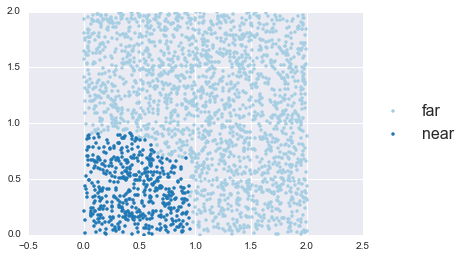

In [32]:
plot_classes(df_predictions_deep)

This seems to be a better approximation to the data. Let's look at the accuracy.

In [33]:
np.mean(df_train.y == df_predictions_deep.y)

0.89759999999999995

The training set accuracy has improved. 

Creating a more complex model (a deeper tree or a tree with a larger number of leaves) improved our training accuracy. What happens if we increase the complexity further?  Let's next try a much deeper tree. 

In [34]:
clf_superdeep = DecisionTreeClassifier(max_leaf_nodes=100)

clf_superdeep.fit(df_train[['X1', 'X2']], df_train['y'])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=100,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

Evaluate predictions.

In [35]:
df_predictions_superdeep = df_train.copy()

df_predictions_superdeep['y'] = clf_superdeep.predict(df_train[['X1','X2']])

In [36]:
np.mean(df_train.y == df_predictions_superdeep.y)

0.93400000000000005

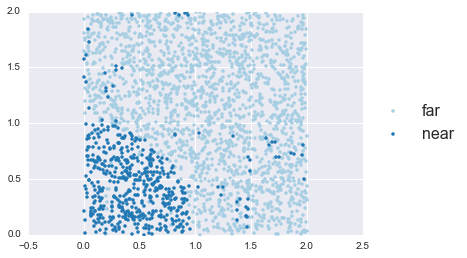

In [37]:
plot_classes(df_predictions_superdeep)

We see that although the accuracy has seemingly improved, our tree started to pick up on the noise in the data; in other words, it is starting to memorize, rather than learn. 

How does the tree look? 

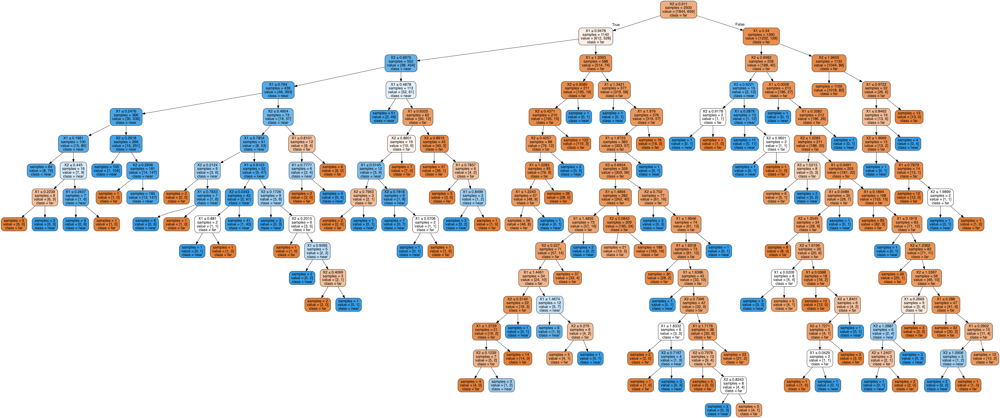

In [38]:
plot_tree(clf_superdeep)

Just for fun, let's go really crazy now, and learn a tree with about a 1000 leaves.

In [39]:
clf_crazy = DecisionTreeClassifier(max_leaf_nodes=1000)

clf_crazy.fit(df_train[['X1', 'X2']], df_train['y'])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=1000,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

And now evaluate this tree.

In [40]:
df_predictions_crazy = df_train.copy()

df_predictions_crazy['y'] = clf_crazy.predict(df_train[['X1','X2']])

In [41]:
np.mean(df_train.y == df_predictions_crazy.y)

1.0

Our accuracy is 100% on the training set! Our model has perfectly memorized the data, including all the noise in it.

In [42]:
plot_tree(clf_crazy)

This doesn't look like it has 1000 leaf nodes, but that's because 1000 was the max value we allowed for the number of leaves, if there aren't enough data points to warrant additional splits, the classification tree algorithm stops splitting. 

Visually compare the predictions with the original classes.

The original data


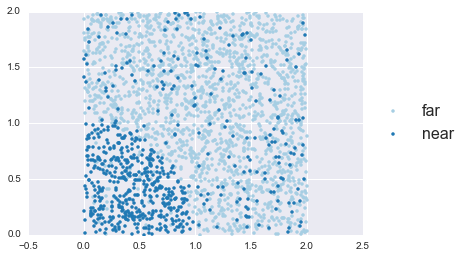

Our predictions


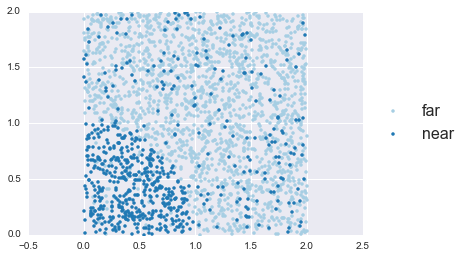

In [52]:
print "The original data"
plot_classes(df_train)
print "Our predictions"
plot_classes(df_predictions_crazy)

This is no longer "learning"; our superdeep tree has basically memorized our training set, with all its noise. I

How do we check this? By using a separate test set, which our model hasn't seen before.

### Testing

Let's evaluate our three classifiers on the separate test set.

In [58]:
# Use different random seed
TEST_SEED = 5
assert TRAIN_SEED != TEST_SEED

np.random.seed(TEST_SEED)

         X1        X2     y
0  0.443986  1.299223   far
1  1.741465  0.367162  near
2  0.413438  0.405239  near
3  1.837222  0.323490   far
4  0.976822  0.939897  near


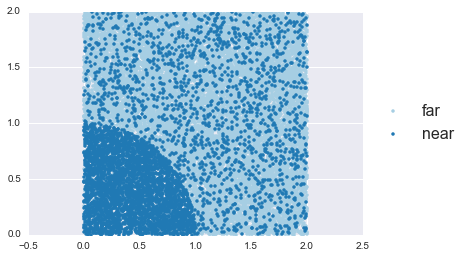

In [59]:
# Use the same flip probability as in the training_set
df_test = create_data(20000, p_flip=0.1)
print df_test.head()
plot_classes(df_test)

Note that we are using the same underlying sample/distribution here to create the training and the test sets. One very common problem in real-life prediction problems is a change in the distribution over time. We learn from past data, but the future distribution is somewhat different from the past. Can we still create satisfactory models? This is a difficult problem, which we will ignore.

In [60]:
print "Test scores on independent data"
print "-------------------------------"
print "Shallow:   ",
print np.mean(clf.predict(df_test[['X1','X2']]) == df_test.y)

print "Deep:      ",
print np.mean(clf_deep.predict(df_test[['X1','X2']]) == df_test.y)

print "Superdeep: ",
print np.mean(clf_superdeep.predict(df_test[['X1','X2']]) == df_test.y)

print "Crazy:     ",
print np.mean(clf_crazy.predict(df_test[['X1','X2']]) == df_test.y)

Test scores on independent data
-------------------------------
Shallow:    0.8685
Deep:       0.8827
Superdeep:  0.86945
Crazy:      0.81875


We see that the second ("deep") tree gets the best accuracy on the test set. So you may be doing perfectly on the training set by using a crazy deep tree, but your **generalization** capability to new data will be really low; you will have **overfit** to the training set. On the other extreme, with a shallow tree, you will **underfit**, and not learn all the relevant structure in the data.

How do we find the "sweet spot" between overfitting and underfitting? By keeping a portion of our training data aside, and **tuning** the depth of our tree by monitoring the performance on that **holdout set**.

### Tuning a decision tree

`scikit-learn` has helpful functions for parameter tuning which you are welcome to learn about, but it will be more informative for us to do this manually ourselves in this assignment.

Once again, we will pretend that we only have access to our training set to create (or tune) our models. We will start by putting aside a part of the training as a **holdout set**.

In [61]:
# Let's fix the number of points we will put aside as the holdout set
# to 20% of the training set (why 20%? no good reason)

n_train_full = len(df_train)
n_train_holdout = n_train_full / 5

We will do the sampling by using the integer indices of the data frame using the `.iloc[]` method to access the data.

My aim in doing this sampling explicitly is to get you familiarized with the nitty-gritty of train/holdout splits. We could also use Pandas to do the sampling for us, which is much easier, but not as informative.

In [68]:
train_full_inds = range(n_train_full)

# A random seed for reproducibility; change this number to get a different sample
HOLDOUT_SEED = 10
np.random.seed(HOLDOUT_SEED)

Now split the set of available training row indices into two pieces, a "`train_train`" piece to build trees on, and a "`train_holdout`" piece to evaluate the trees.

In [69]:
train_holdout_inds = np.random.choice(train_full_inds, size = n_train_holdout, replace=False)
train_train_inds   = np.setdiff1d(train_full_inds, train_holdout_inds)

In [71]:
train_holdout_inds.sort()

In [72]:
# Look at a few examples of our chosen indices; the two sets should be disjoint
print train_holdout_inds[:10]
print train_train_inds[:10]

[ 1  5 11 16 17 18 20 25 27 28]
[ 0  2  3  4  6  7  8  9 10 12]


Now using these indices and the `.iloc[]` method of Pandas, split the training set into two pieces.

In [73]:
df_train_train = df_train.iloc[train_train_inds]
df_train_holdout = df_train.iloc[train_holdout_inds]

Take a quick look at the split data.

In [74]:
df_train_train.head()

,X1,X2,y
0,1.101596,0.550481,far
2,0.581809,0.879703,far
3,1.021655,1.562559,far
4,1.785894,0.583550,far
6,0.251171,0.528810,near


In [75]:
df_train_holdout.head()

,X1,X2,y
1,1.416296,1.704858,far
5,1.792586,1.403474,far
11,0.913666,0.198605,far
16,0.047964,0.494611,near
17,1.117708,1.024084,far


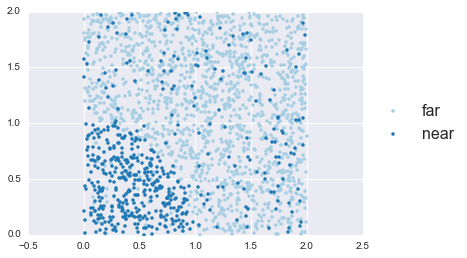

In [76]:
plot_classes(df_train_train)

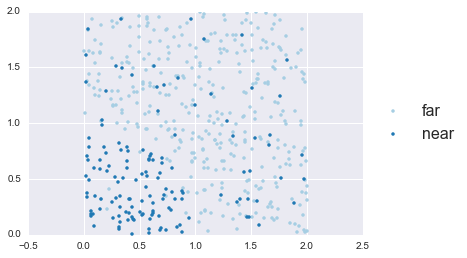

In [77]:
plot_classes(df_train_holdout)

The simpler, Pandas way of doing this split would be to use the `sample` method of Pandas DataFrame objects:
```
df_train_holdout = df_train.sample(frac = 0.2)
df_train_train   = df_train.drop(df_train_holdout.index)
```
We won't be doing this for now.

Now that we have a training piece (`train_train`) and a holdout piece (`train_holdout`), let's try a whole bunch of trees, and see which size (`max_leaf_nodes`) is the best. We will build a tree on the training set, and evaluate it on the holdout set.

In [79]:
# Dictionaries to hold the accuracy values we encounter
train_accuracies = {}
holdout_accuracies = {}

# The range of max_leaf_nodes to try
max_leaf_nodes_values = range(2,120,2)

# Loop over all values
for my_max_leaf_nodes in max_leaf_nodes_values:

    # Create a classifier with this given number of max_leaf_nodes
    clf = DecisionTreeClassifier(max_leaf_nodes=my_max_leaf_nodes)
    # Fit the created classifier to the train_train data
    clf.fit(df_train_train[['X1','X2']], df_train_train.y)

    # Make predictions on the training set
    train_preds = clf.predict(df_train_train[['X1','X2']])

    # Make predictions on the holdout set
    holdout_preds = clf.predict(df_train_holdout[['X1','X2']])

    # Evaluate accuracy on each data set
    train_accuracy = np.mean(train_preds==df_train_train.y)
    holdout_accuracy = np.mean(holdout_preds == df_train_holdout.y)

    print "max_leaf_nodes = {:03} Training accuracy: {:03.2f}, Holdout accuracy: {:03.2f}".\
        format(my_max_leaf_nodes,train_accuracy, holdout_accuracy)

    # Record the accuracies
    train_accuracies[my_max_leaf_nodes] = train_accuracy
    holdout_accuracies[my_max_leaf_nodes] = holdout_accuracy

max_leaf_nodes = 002 Training accuracy: 0.74, Holdout accuracy: 0.72
max_leaf_nodes = 004 Training accuracy: 0.88, Holdout accuracy: 0.88
max_leaf_nodes = 006 Training accuracy: 0.90, Holdout accuracy: 0.89
max_leaf_nodes = 008 Training accuracy: 0.90, Holdout accuracy: 0.89
max_leaf_nodes = 010 Training accuracy: 0.90, Holdout accuracy: 0.90
max_leaf_nodes = 012 Training accuracy: 0.91, Holdout accuracy: 0.90
max_leaf_nodes = 014 Training accuracy: 0.91, Holdout accuracy: 0.90
max_leaf_nodes = 016 Training accuracy: 0.91, Holdout accuracy: 0.90
max_leaf_nodes = 018 Training accuracy: 0.91, Holdout accuracy: 0.89
max_leaf_nodes = 020 Training accuracy: 0.91, Holdout accuracy: 0.89
max_leaf_nodes = 022 Training accuracy: 0.91, Holdout accuracy: 0.89
max_leaf_nodes = 024 Training accuracy: 0.91, Holdout accuracy: 0.89
max_leaf_nodes = 026 Training accuracy: 0.91, Holdout accuracy: 0.89
max_leaf_nodes = 028 Training accuracy: 0.91, Holdout accuracy: 0.89
max_leaf_nodes = 030 Training accu

In [80]:
# Compile the training and holdout accuracies into a data frame called tuning_accuracies
tuning_accuracies_df = pd.DataFrame({'train':train_accuracies, 'holdout': holdout_accuracies})
tuning_accuracies_df.index.name = 'max_leaf_nodes'

Take a quick look at the compiled accuracies.

In [81]:
tuning_accuracies_df.head()

,holdout,train
max_leaf_nodes,,
2,0.720,0.7420
4,0.884,0.8790
6,0.890,0.8970
8,0.892,0.9015
10,0.896,0.9040


Let's next visualize the accuracies we encountered.

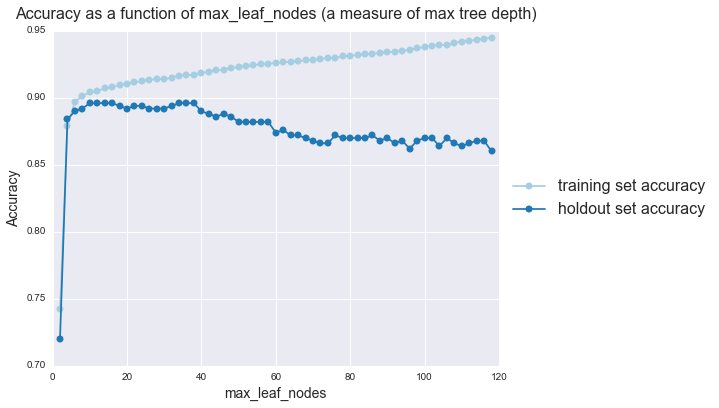

In [89]:
plt.figure(figsize=(8,6))
plt.title("Accuracy as a function of max_leaf_nodes (a measure of max tree depth)", fontsize=16, y=1.02)
plt.plot(tuning_accuracies_df.train, 'o-', label='training set accuracy')
plt.plot(tuning_accuracies_df.holdout, 'o-', label='holdout set accuracy')
plt.xlabel('max_leaf_nodes', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=16)
plt.show()

We see that while the training set accuracy keeps increasing as we increase `max_leaf_nodes`, the holout set accuracy hits a peak and starts to go down. As we increase `max_leaf_nodes`, our tree starts to memorize, or overfit to the training set, and starts to lose the generalization capability; it does worse on data points it hasn't seen before. Using a holdout set allowed ourselves to have an independent evaluation of each tree, and to avoid fooling ourselves into thinking that we were getting better and better with higher `max_leaf_nodes`.

Finally, let's evaluate our best model configuration on a separate test set.

In [92]:
best_max_leaf_nodes = tuning_accuracies_df.holdout.argmax()
print "The best value found for max_leaf_nodes: ", best_max_leaf_nodes

The best value found for max_leaf_nodes:  10


Create a final model on the full training set, using this best value.

In [93]:
clf_best = DecisionTreeClassifier(max_leaf_nodes=best_max_leaf_nodes)
clf.fit(df_train[['X1','X2']], df_train['y'])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=118,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

Create new test set.

In [95]:
# Use different random seed
NEW_TEST_SEED = 15
np.random.seed(NEW_TEST_SEED)

# Use the same flip probability as in the training_set
df_test_final = create_data(20000, p_flip=0.1)

In [99]:
final_test_accuracy = np.mean(clf.predict(df_test_final[['X1','X2']]) == df_test_final['y'])
print "Final accuracy of the best model on the test set: ", final_test_accuracy
print "The best holdout accuracy was: ", tuning_accuracies_df.holdout.max()

Final accuracy of the best model on the test set:  0.86915
The best holdout accuracy was:  0.896


You can see that the holdout accuracy is better than the final test accuracy; so if we hadn't done this final test (for which we used a much larger test set than the holdout set), we would over estimate the performance of our model. 

The accuracy on the holdout set depends on the particular sample used as a holdout, and will vary from sample to sample. There are ways to reduce this variance; one such way is called cross-validation (mentioned in class). We will use this below in the Titanic example below.

## Titanic

### Read, pre-process data

- Upload the Titanic datasets you got from Kaggle, `train.csv` and `test.csv`, to the directory of this assigment.

- Using Pandas,
  - Read the training dataset `train.csv` into the variable `titanic`.
  - Read the testing dataset `test.csv` into the variable titanic_test.

In [ ]:
## your code here
titanic = 
titanic_test = 

- Using Pandas, drop the following columns from both `titanic` and `titanic_test:
  - `Name`, `Cabin`, `Ticket`, `PassengerId`
- Look at a few rows of `titanic` and `titanic_test` to make sure that you successfully dropped these columns.

- Create two lists, `cat_cols` and `num_cols` that contain the list of categorical and numerical columns in the data frame `titanic`, respectively. (You can refer to the previous homeworks, or use the `dtype` attribute of columns)
- Print the `cat_cols` and `num_cols` variables to do a manual sanity check.

In [ ]:
## your code here
cat_cols = 
num_cols = 

### Exploratory data analysis

- Create histograms for all the numerical columns in `titanic`.

- Print the value counts of all the catogries in all categorical columns
- Hint: There should be two categorical columns

- Create bar plots of the value counts for all categorical columns
- You should have two such bar plots, one for each categorical column

- Print the number of missing values in each one of the columns of `titanic`
- You should find that one numerical column and one categorical column have missing values.

- Create a dictionary called `medians` whose keys are the names of the numerical columns, and whose values are the medians of the corresponding columns

- Using the medians dictionary, replace all the missing **numerical** values in `titanic` by the median of the corresponding column.
- Do this by creating a new data frame called `titanic_filled`--do not update `titanic` itself.

- Next, create a dictionary called `most_freq_cats` whose keys are the names of the categorical columns and whose values are the most frequent category of the corresponding columns

- Using the medians dictionary, replace all the missing **categorical** values in `titanic_filled` by the most frequent category of the corresponding column.
- This time, do this by updating `titanic_filled`. 

- After this step, this data frame should not have any missing values (we replaced both the numerical and the categorical missing values); check that there are no more missing values in `titanic_filled`

- Look at the first few rows of `titanic_filled`

We will next convert the categorical columns to numerical ones. For this purpose, we will use the `.get_dummies()` method of Pandas. Read about it [here](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.get_dummies.html) if you haven't already. 

- Using the `.get_dummies()` method of Pandas, create a variable names `titanic_all_num`, that contains an all-numerical version of `titanic_filled.

- Look at the first few rows of `titanic_all_num`
- How many columns does `titanic_all_num` have? How manu columns did `titanic_filled` have?

### Train-holdout split

- Using either the `.sample()` method of Pandas DataFrame objects or manually sampling the indices using `NumPy`, split the data frame `titanic_all_num` into two picece: `titanic_holdout` and `titanic_train`. I leave the fractional sizes of the two pieces to you.
- Make sure to use a random seed so that your samples are reproducible (note that in Pandas this is done by a parameter to the `.sample()` function).

### Creating one model

- Using the `DecisionTreeClassifier` of `scikit-learn`, build a single tree model using the training data. Feel free to pick a parameter setting of your choice, or go with the default settings of `DecisionTreeClassifier`.

- Using your trained model, make two sets of predictions, one for the training set, the other for the holdout set.

- Obtain the classification accuracy (i.e., the fraction of correct predictions) of the two sets of predictions

### Tuning a classification tree

- Loop over a range of values for `max_leaf_nodes`
  - For each value, build a classification tree model with that value for the `max_leaf_nodes` parameter
  - Using the model, make predictions on the training set and the holdout set
  - Evaluate the classification accuracy (fraction of correct predictions) on the training and holdout sets
  - Compile the two sets of predictions into a data frame

- Plot the training and holdout accuracies as a function of the `max_leaf_nodes` value

- Obtain the value of `max_leaf_nodes` with the best accuracy on the holdout set

- Using the best value of `max_leaf_nodes` found, train a new classification tree, this time using the full dataset (training + holdout)

- Using this final model, make predictions on the test set. Note that you will have to transform the test set in the same way that you transformed the training set. 

### Bonus: 5-fold cross-validation

In the accuracy plots for the holdout set, you may have observed that the dependence of accuracy on `max_leaf_nodes` seems a little irregular. This is because of the small size of your (holdout) dataset. Due to this irregularity, it is hard to be confident about the best value for the `max_leaf_nodes` found. One way to deal with this irregularity is to use cross-validation. As mentioned in class, this means splitting your training set into a number of (say 5) equal-sized pieces, and for each parameter value (of `max_leaf_nodes`) letting each piece be a holdout set once. To evaluate each value of `max_leaf_nodes`, you calculate the average of the 5 accuracy values obtained. In this section, we will use 5-fold cross-validation to tune a model.

#### Create the cross-validation (CV) "folds"

- Go back to `titanic_all_num`, and create a variable `num_inds`, equal to the the number of its rows (or indices).
- Create another variable, `all_inds`, that holds a NumPy array of integers, starting from 0, going all the way up to `num_inds` (not inclusive). This is the set of all integer indices for our training set.

Below, I will give examples for the case where there are only 20 rows, i.e., num_inds = 20, to help clarify what I mean.

If num_inds = 20, then all_inds = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19].

- Using the NumPy function `np.random.shuffle()`, shuffle the array `all_inds` in place.

If num_inds = 20, this may, for example, make all_inds = [19,  3, 18,  6, 13,  4,  0, 17, 12, 11, 15, 10,  9,  2, 16,  7,  8,
        1,  5, 14]

We will next split this set of shuffled indices into 5 approximately equal-sized subsets. In order to do this, we start by creating the split points. 

- Create a variable named `index_bds` that contains a 6-element, approximately equally-spaced array of integers starting at 0, ending at `num_inds` (inclusive). 

- For example
  - If num_inds were 20, our array would be completely evenly spaced
    - [0, 4, 8, 12, 16, 20]
  - If num_inds were 22, our array can't be evenly spaced, but it could be something like
    - [0, 4, 8, 13, 17, 22]
- Make sure that your array consists of integers, not floats.

- Create a dictionary called `cv_holdout_inds`, whose keys are integers from 0 to 4 (inclusive), and its values are the elements of `all_inds` at the positions between the corresponding index_bds.
- For example
  - In our example above, the shuffled `all_inds` was `[19,  3, 18,  6, 13,  4,  0, 17, 12, 11, 15, 10,  9,  2, 16,  7,  8, 1,  5, 14]`
  - This will make, 
```
     cv_holdout_inds = {0: [19,  3, 18,  6],
                        1: [13,  4,  0, 17],
                        2: [12, 11, 15, 10],
                        3: [9,  2, 16,  7],
                        4: [8, 1,  5, 14]}
```

- Create a second dictionary, called `cv_train_inds`, whose keys are the same as those of `cv_holdout_inds`, but whose values are complement of the indices in the corresponding `cv_holdout_inds`
- Continuing the example above, this would make:
```
cv_train_inds = {0: array([13,  4,  0, 17, 12, 11, 15, 10,  9,  2, 16,  7,  8,  1,  5, 14]),
                  1: array([19,  3, 18,  6, 12, 11, 15, 10,  9,  2, 16,  7,  8,  1,  5, 14]),
                  2: array([19,  3, 18,  6, 13,  4,  0, 17,  9,  2, 16,  7,  8,  1,  5, 14]),
                  3: array([19,  3, 18,  6, 13,  4,  0, 17, 12, 11, 15, 10,  8,  1,  5, 14]),
                  4: array([19,  3, 18,  6, 13,  4,  0, 17, 12, 11, 15, 10,  9,  2, 16,  7])}
```

#### Using the folds, tune a model

- Now, once again, write a loop that goes over a range of values for `max_leaf_nodes`, but this time, for each value, it builds 5 models instead of a single model; one model for each cv_train_inds value
- You will do this by subsetting titanic_all_num using the 5 different lists in `cv_train_inds`, and building a separate model for each list. Note that you can do this by looping over the 5 folds.
- For each model you build, evaluate the accuracy on the **corresponding** holdout set.
- Then average the 5 holdout accuracies, and store that value for as the 5-fold cross-validation accuracy for the `max_leaf_nodes` value tried
- Finally, as in the holdout tuning, plot the cross-validation accuracy as a function of the `max_leaf_nodes` values tried, and pick the best `max_leaf_nodes` value
- Train a model on the full dataset `titanic_all_num` using the best value found
- Finally, make predictions on the test set, using this best value found